In [1]:
# стандартные библиотеки
import random
import time

# табличные данные
import numpy as np
import pandas as pd

# визуализация
import matplotlib.pyplot as plt
import seaborn as sns

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

# HuggingFace
from datasets import load_dataset
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    TrainingArguments,
    EarlyStoppingCallback,
)

# sklearn
from sklearn.metrics import f1_score, accuracy_score, classification_report

# IPython
from IPython.display import display, HTML



# фиксация random

seed = 42

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# для полной воспроизводимости
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [50]:
import pkg_resources

libs = [
    "numpy", "pandas", "matplotlib", "seaborn",
    "torch", "datasets", "transformers", "scikit-learn",
    "peft", "lime", "onnxruntime", "onnxscript"
]

for lib in libs:
    try:
        version = pkg_resources.get_distribution(lib).version
        print(f"{lib}=={version}")
    except pkg_resources.DistributionNotFound:
        print(f"# {lib} — не найдено")

numpy==2.0.2
pandas==2.2.2
matplotlib==3.10.0
seaborn==0.13.2
torch==2.9.0+cu128
datasets==4.0.0
transformers==5.0.0
scikit-learn==1.6.1
peft==0.18.1
lime==0.2.0.1
onnxruntime==1.24.1
onnxscript==0.6.2


/tmp/ipython-input-547055217.py:1: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources


## Загрузка данных и EDA

In [3]:
# Русскоязычный перевод датасета GoEmotions (Google).
# Комментарии с Reddit, размечены по 28 эмоциям (admiration, anger, joy и др.).
# Версия simplified — около 54k текстов с готовыми train/val/test сплитами.

dataset = load_dataset("seara/ru_go_emotions", 'simplified')
print(dataset)

DatasetDict({
    train: Dataset({
        features: ['ru_text', 'text', 'labels', 'id'],
        num_rows: 43410
    })
    validation: Dataset({
        features: ['ru_text', 'text', 'labels', 'id'],
        num_rows: 5426
    })
    test: Dataset({
        features: ['ru_text', 'text', 'labels', 'id'],
        num_rows: 5427
    })
})


In [4]:
print(dataset["train"][0])

{'ru_text': 'Моя любимая еда — это все, что мне не приходилось готовить самому.', 'text': "My favourite food is anything I didn't have to cook myself.", 'labels': [27], 'id': 'eebbqej'}


In [5]:
raw_names = dataset["train"].features["labels"].feature.names
print(f"Всего классов: {len(raw_names)}")
print(raw_names)

id2label = {i: name for i, name in enumerate(raw_names)}
label2id = {name: i for i, name in enumerate(raw_names)}
label_names = list(raw_names)

# разворачиваем список в одно число : [27] --> 27
def unwrap_label(example):
    example["label"] = example["labels"][0] if example["labels"] else label2id["neutral"]
    return example

dataset = dataset.map(unwrap_label)

# gроверка
ex = dataset["train"][0]
print(f"\nТекст:  {ex['ru_text']}")
print(f"labels: {ex['labels']}  -->  label: {ex['label']} -->  {id2label[ex['label']]}")

Всего классов: 28
['admiration', 'amusement', 'anger', 'annoyance', 'approval', 'caring', 'confusion', 'curiosity', 'desire', 'disappointment', 'disapproval', 'disgust', 'embarrassment', 'excitement', 'fear', 'gratitude', 'grief', 'joy', 'love', 'nervousness', 'optimism', 'pride', 'realization', 'relief', 'remorse', 'sadness', 'surprise', 'neutral']

Текст:  Моя любимая еда — это все, что мне не приходилось готовить самому.
labels: [27]  -->  label: 27 -->  neutral


In [6]:
df_train = dataset["train"].to_pandas()
df_val   = dataset["validation"].to_pandas()
df_test  = dataset["test"].to_pandas()

print(f"Train:      {len(df_train):>6,} строк")
print(f"Validation: {len(df_val):>6,} строк")
print(f"Test:       {len(df_test):>6,} строк")
print(f"Итого:      {len(df_train) + len(df_val) + len(df_test):>6,} строк")
print('')

# проверка
print(df_train.columns.tolist())
print(df_train[["ru_text", "label"]].head(3))

Train:      43,410 строк
Validation:  5,426 строк
Test:        5,427 строк
Итого:      54,263 строк

['ru_text', 'text', 'labels', 'id', 'label']
                                             ru_text  label
0  Моя любимая еда — это все, что мне не приходил...     27
1  Теперь, если он покончит с собой, все будут ду...     27
2                КАКОГО НАХРАНА БЭЙЛЕССКАЯ ИЗОИНЦИЯ?      2


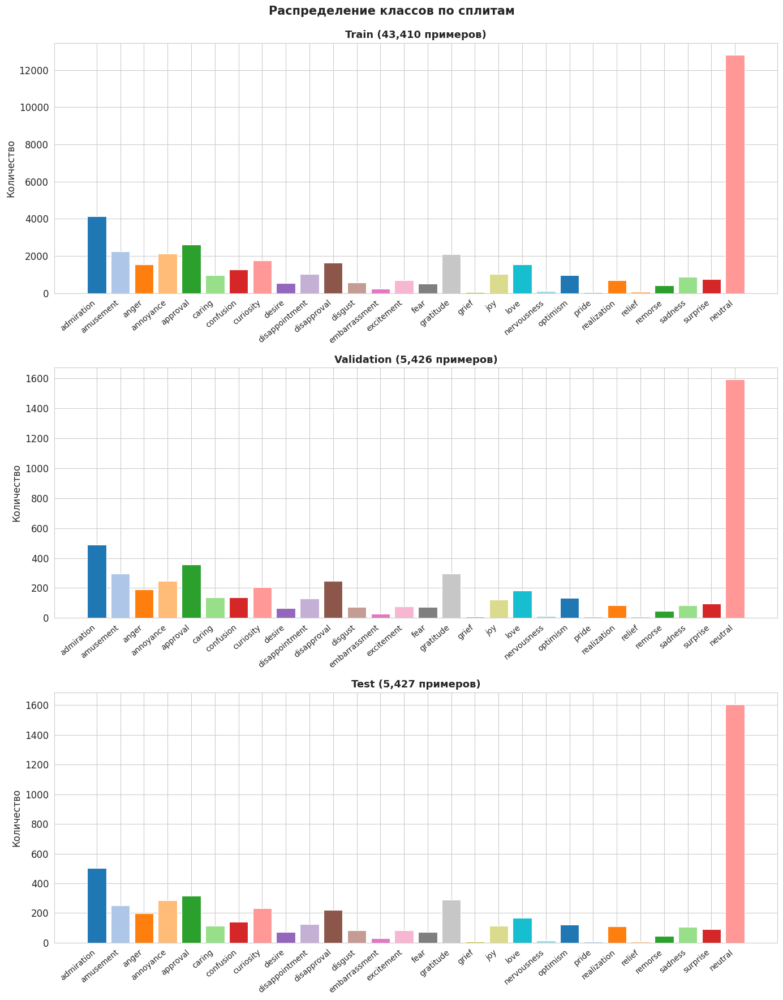

In [7]:
sns.set_style("whitegrid")
plt.rcParams["font.size"] = 12

fig, axes = plt.subplots(3, 1, figsize=(14, 18))

for ax, (df, split_name) in zip(axes, [(df_train, "Train"), (df_val, "Validation"), (df_test, "Test")]):
    counts = df["label"].value_counts().sort_index()
    labels = [id2label[i] for i in counts.index]
    colors = plt.cm.tab20.colors[:len(counts)]

    ax.bar(labels, counts.values, color=colors, edgecolor="white", linewidth=0.8)
    ax.set_title(f"{split_name} ({len(df):,} примеров)", fontweight="bold", fontsize=13)
    ax.set_ylabel("Количество")
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(labels, rotation=40, ha="right", fontsize=10)

plt.suptitle("Распределение классов по сплитам\n", fontsize=15, fontweight="bold")
plt.tight_layout()
plt.show()

Как можно заметить на графиках есть дисбаланс классов в сторону нейтрального класса

In [8]:
print("Train: распределение классов\n")
vc = df_train["label"].value_counts().sort_index()
for idx, cnt in vc.items():
    print(f"  {id2label[idx]:15s}: {cnt:>6,} ({cnt/len(df_train)*100:.1f}%)")

imbalance_ratio = vc.max() / vc.min()
print(f"\nСоотношение max/min классов: {imbalance_ratio:.2f}x")

Train: распределение классов

  admiration     :  4,130 (9.5%)
  amusement      :  2,244 (5.2%)
  anger          :  1,547 (3.6%)
  annoyance      :  2,138 (4.9%)
  approval       :  2,596 (6.0%)
  caring         :    966 (2.2%)
  confusion      :  1,268 (2.9%)
  curiosity      :  1,772 (4.1%)
  desire         :    543 (1.3%)
  disappointment :  1,028 (2.4%)
  disapproval    :  1,651 (3.8%)
  disgust        :    580 (1.3%)
  embarrassment  :    248 (0.6%)
  excitement     :    700 (1.6%)
  fear           :    510 (1.2%)
  gratitude      :  2,096 (4.8%)
  grief          :     65 (0.1%)
  joy            :  1,013 (2.3%)
  love           :  1,533 (3.5%)
  nervousness    :    105 (0.2%)
  optimism       :    974 (2.2%)
  pride          :     57 (0.1%)
  realization    :    698 (1.6%)
  relief         :     96 (0.2%)
  remorse        :    404 (0.9%)
  sadness        :    874 (2.0%)
  surprise       :    751 (1.7%)
  neutral        : 12,823 (29.5%)

Соотношение max/min классов: 224.96x


Датасет сильно несбалансирпован, поэтому лучше использовать Macro F1 как основную метрику

In [9]:
# Считаем длину в символах и словах
df_train["text_len_chars"] = df_train["ru_text"].str.len()
df_train["text_len_words"] = df_train["ru_text"].str.split().str.len()
df_train["label_name"]     = df_train["label"].map(id2label)

print("Статистика длины текстов (в словах)\n")
print(df_train["text_len_words"].describe().round(1).to_string())

Статистика длины текстов (в словах)

count    43410.0
mean        11.8
std          6.4
min          1.0
25%          6.0
50%         11.0
75%         17.0
max         38.0


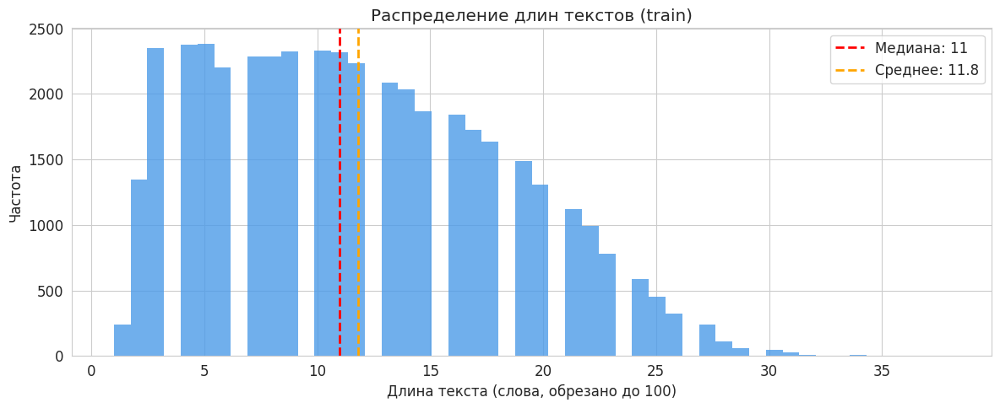

In [10]:
df_train["label_name"]     = df_train["label"].map(id2label)
df_train["text_len_words"] = df_train["ru_text"].str.split().str.len()



fig, ax = plt.subplots(figsize=(12, 5))

ax.hist(df_train["text_len_words"].clip(upper=100), bins=50,
        color="#4C9BE8", edgecolor="none", alpha=0.8)
ax.set_xlabel("Длина текста (слова, обрезано до 100)")
ax.set_ylabel("Частота")
ax.set_title("Распределение длин текстов (train)")

# медиана и среднее
median = df_train["text_len_words"].median()
mean   = df_train["text_len_words"].mean()
ax.axvline(median, color="red",    linestyle="--", linewidth=2, label=f"Медиана: {median:.0f}")
ax.axvline(mean,   color="orange", linestyle="--", linewidth=2, label=f"Среднее: {mean:.1f}")
ax.legend()

plt.tight_layout()
plt.show()

In [11]:
# Статистика длин по классам
print("Средняя длина текста (слова) по классам\n")
print(df_train.groupby("label_name")["text_len_words"].agg(["mean", "median", "max"]).round(1))

# Процент очень длинных текстов
long = (df_train["text_len_words"] > 64).sum()
print(f"\nТекстов длиннее 64 токенов: {long} ({long/len(df_train)*100:.1f}%)")

Средняя длина текста (слова) по классам

                mean  median  max
label_name                       
admiration      10.7    10.0   33
amusement       11.8    11.0   34
anger           11.0    10.0   31
annoyance       13.0    13.0   34
approval        12.7    12.0   31
caring          12.7    12.0   31
confusion       13.1    13.0   31
curiosity       11.7    11.0   30
desire          13.7    13.0   31
disappointment  13.1    13.0   32
disapproval     12.8    12.0   31
disgust         11.5    11.0   28
embarrassment   13.0    12.5   27
excitement      10.5    10.0   29
fear            11.8    11.0   32
gratitude       10.0     9.0   31
grief           11.5     9.0   27
joy             11.6    11.0   28
love            11.3    10.0   29
nervousness     13.0    13.0   27
neutral         11.5    11.0   38
optimism        14.0    14.0   31
pride           11.0    10.0   32
realization     13.8    13.0   34
relief          12.2    12.0   26
remorse         12.5    12.0   32
sadness

max_length=64 при токенизации будет достаточно

In [12]:
print('Примеры текстов по классам:')
print('-' * 100)
for label_name in label_names:
    print(f"\nКласс: {label_name.upper()}")
    samples = df_train[df_train["label_name"] == label_name]["ru_text"].sample(2, random_state=42)
    for i, text in enumerate(samples, 1):
        print(f"  {i}. {text[:200]}")


Примеры текстов по классам:
----------------------------------------------------------------------------------------------------

Класс: ADMIRATION
  1. О, хорошо! Да, иногда сложно уловить сарказм
  2. хаха, я не помню, чтобы Рэмпейдж комментировал этот момент в прямом эфире, хорошая вещь.

Класс: AMUSEMENT
  1. >Безжалостная, лол, только в сознании этих людей она в порядке.
  2. Я никогда не говорил, что его нужно было вызвать. Я просто думаю, что это забавно, что повтор буквально показывает это.

Класс: ANGER
  1. Это чуть ли не хуже Санта Кона. Можем ли мы заставить миллениалов уничтожить это, пожалуйста?
  2. Мгновенная карма для нетерпеливого осла, не заслуживающего права водить машину.

Класс: ANNOYANCE
  1. Я вас понимаю! Некоторым из нас лучше не становится, мне надоело слышать, что становится лучше.
  2. также Приложение: я взорвусь, когда захочу причинить тебе боль

Класс: APPROVAL
  1. Согласен, если подумать о животных, то это грустно. Если вы думаете о профилях крови нуле

In [15]:
# посмотрим на токенизацию


# Ииспользуем токенизатор той модели, которую будем дообучать
MODEL_NAME = "cointegrated/rubert-tiny2"
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

# длину в токенах на выборке
sample_size = 5000
sample_texts = df_train["ru_text"].sample(sample_size, random_state=42).tolist()
token_lengths = [len(tokenizer.encode(text, truncation=False)) for text in sample_texts]

import numpy as np
print(f"Статистика длин в токенах (выборка {sample_size} примеров):\n")
print(f"Mean:   {np.mean(token_lengths):.1f}")
print(f"Median: {np.median(token_lengths):.1f}")
print(f"95th%:  {np.percentile(token_lengths, 95):.1f}")
print(f"99th%:  {np.percentile(token_lengths, 99):.1f}")
print(f"Max:    {np.max(token_lengths)}")

for cutoff in [64, 128, 256]:
    pct = np.mean(np.array(token_lengths) <= cutoff) * 100
    print(f"Текстов <= {cutoff} токенов: {pct:.1f}%")

Статистика длин в токенах (выборка 5000 примеров):

Mean:   19.7
Median: 19.0
95th%:  35.0
99th%:  42.0
Max:    77
Текстов <= 64 токенов: 99.9%
Текстов <= 128 токенов: 100.0%
Текстов <= 256 токенов: 100.0%


Как уже написал выше max_length=64 будет достаточно для абсолютного больинсттва примеров

In [16]:
print("Проверка качества данных")

# Пустые значения
print(f"\nПрoпуски в 'ru_text' (train): {df_train['ru_text'].isna().sum()}")
print(f"Пустые строки (train):         {(df_train['ru_text'] == '').sum()}")

# Дубликаты
dup_count = df_train.duplicated(subset=["ru_text"]).sum()
print(f"Дубликаты по тексту (train):   {dup_count} ({dup_count/len(df_train)*100:.2f}%)")

# Очень короткие тексты
short = (df_train["text_len_words"] <= 2).sum()
print(f"Тексты <= 2 слов (train):       {short} ({short/len(df_train)*100:.2f}%)")

# Утечка между сплитами
overlap_train_test = set(df_train["ru_text"]) & set(df_test["ru_text"])
print(f"\nПересечение train ∩ test:       {len(overlap_train_test)} текстов")

Проверка качества данных

Прoпуски в 'ru_text' (train): 0
Пустые строки (train):         0
Дубликаты по тексту (train):   295 (0.68%)
Тексты <= 2 слов (train):       1586 (3.65%)

Пересечение train ∩ test:       53 текстов


Нужно немного почистить датасеты от дубликатов и пересечения train с тестом, возможно от коротких текстов

In [17]:
# уберем дубликаты
df_train = df_train.drop_duplicates(subset=["ru_text"]).reset_index(drop=True)
print(f"Train после удаления дубликатов: {len(df_train):,} строк")

Train после удаления дубликатов: 43,115 строк


In [18]:
# пересечения
overlap = set(df_test["ru_text"])
df_train = df_train[~df_train["ru_text"].isin(overlap)].reset_index(drop=True)
print(f"Train после удаления пересечений с test: {len(df_train):,} строк")

Train после удаления пересечений с test: 43,062 строк


In [19]:
# короткие тексты
print(df_train[df_train["text_len_words"] <= 2][["ru_text", "label_name"]].sample(10, random_state=101))

                    ru_text  label_name
32480              Ох....фу     disgust
31833        Заткнись, Мэг!       anger
2701             Ф. Нет!!!!     neutral
36766          спасибо, ЖА!   gratitude
29866     Огромное спасибо❤   gratitude
29113        Целая троица!!     neutral
13457  Приятно, поздравляю!  admiration
32502        скелет какашек     neutral
12101          Как перчатка     neutral
39392        Спасибо [ИМЯ].   gratitude


В целом можно оставить, благодарность и эмоции понятны, тексты не мусорные

In [20]:
# итоговые датасеты
print(f"Train:      {len(df_train):,}")
print(f"Validation: {len(df_val):,}")
print(f"Test:       {len(df_test):,}")

Train:      43,062
Validation: 5,426
Test:       5,427


## Итоги EDA

**Датасет:** `seara/ru_go_emotions` (simplified)  
**Задача:** многоклассовая классификация, 28 классов эмоций

### Что было сделано:
1. **Загрузка и маппинг** — развернули `labels: [27]` -> `label: 27`, построили `id2label` / `label2id`
2. **Очистка датасета** — удалили 295 дубликатов (0.68%) и 53 пересечения train c test, данные не текут в тест
3. **Распределение классов** — датасет сильно несбалансирован: `neutral` доминирует, редкие классы (`grief`, `pride`, `nervousness`) представлены слабо -> используем **macro F1** как основную метрику
4. **Длина текстов** — тексты короткие (медиана примерно 11 слов, максимум 38), все укладываются в 64 токена -> устанавливаем `max_length=64`
5. **Качество данных** — пропусков нет, короткие тексты (≤2 слов, 3.65%) осмысленны и оставлены

### Параметры для следующего этапа:
- `max_length = 64`
- `num_labels = 28`
- `metric = macro F1`
- Модель: `cointegrated/rubert-tiny2` - не обучалась на нашем датасете

## Бейзлайн (модель как есть)

In [21]:
model_name = "cointegrated/rubert-tiny2"
tokenizer = AutoTokenizer.from_pretrained(model_name)

# токенизация
def tokenize(batch):
    return tokenizer(batch["ru_text"], truncation=True, padding="max_length", max_length=64)

dataset_clean = dataset.map(tokenize, batched=True)
dataset_clean = dataset_clean.map(lambda x: {"label": x["labels"][0] if x["labels"] else label2id["neutral"]})

# убираем лишние колонки
dataset_clean = dataset_clean.remove_columns(["ru_text", "text", "labels", "id"])
dataset_clean.set_format("torch")

print(dataset_clean)

Map:   0%|          | 0/43410 [00:00<?, ? examples/s]

Map:   0%|          | 0/5426 [00:00<?, ? examples/s]

Map:   0%|          | 0/5427 [00:00<?, ? examples/s]

Map:   0%|          | 0/43410 [00:00<?, ? examples/s]

Map:   0%|          | 0/5426 [00:00<?, ? examples/s]

Map:   0%|          | 0/5427 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['label', 'input_ids', 'token_type_ids', 'attention_mask'],
        num_rows: 43410
    })
    validation: Dataset({
        features: ['label', 'input_ids', 'token_type_ids', 'attention_mask'],
        num_rows: 5426
    })
    test: Dataset({
        features: ['label', 'input_ids', 'token_type_ids', 'attention_mask'],
        num_rows: 5427
    })
})


In [22]:
# загружаем модель как есть (без дообучения)
model = AutoModelForSequenceClassification.from_pretrained(
    model_name,
    num_labels=28,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True
)

Loading weights:   0%|          | 0/55 [00:00<?, ?it/s]

BertForSequenceClassification LOAD REPORT from: cointegrated/rubert-tiny2
Key                                        | Status     | 
-------------------------------------------+------------+-
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED | 
cls.seq_relationship.weight                | UNEXPECTED | 
cls.seq_relationship.bias                  | UNEXPECTED | 
cls.predictions.transform.dense.weight     | UNEXPECTED | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED | 
cls.predictions.transform.dense.bias       | UNEXPECTED | 
bert.embeddings.position_ids               | UNEXPECTED | 
cls.predictions.bias                       | UNEXPECTED | 
classifier.bias                            | MISSING    | 
classifier.weight                          | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider trai

In [23]:
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=-1)
    return {
        "accuracy":    accuracy_score(labels, preds),
        "macro_f1":    f1_score(labels, preds, average="macro",    zero_division=0),
        "weighted_f1": f1_score(labels, preds, average="weighted", zero_division=0),
    }

training_args = TrainingArguments(
    output_dir="./baseline",
    per_device_eval_batch_size=64,
    report_to="none",
)

trainer = Trainer(
    model=model,
    args=training_args,
    eval_dataset=dataset_clean["test"],
    compute_metrics=compute_metrics,
)

baseline_results = trainer.evaluate()
print("\Baseline (без дообучения)")
for k, v in baseline_results.items():
    print(f"  {k}: {v:.4f}" if isinstance(v, float) else f"  {k}: {v}")

<>:24: SyntaxWarning: invalid escape sequence '\B'
<>:24: SyntaxWarning: invalid escape sequence '\B'
/tmp/ipython-input-3679654677.py:24: SyntaxWarning: invalid escape sequence '\B'
  print("\Baseline (без дообучения)")


\Baseline (без дообучения)
  eval_loss: 3.3386
  eval_model_preparation_time: 0.0009
  eval_accuracy: 0.0243
  eval_macro_f1: 0.0199
  eval_weighted_f1: 0.0287
  eval_runtime: 1.2172
  eval_samples_per_second: 4458.5080
  eval_steps_per_second: 69.8310


## Baseline (без дообучения)

| Метрика | Значение |
|---|---|
| Loss | 3.3386 |
| Accuracy | 0.0243 |
| Macro F1 | 0.0199 |
| Weighted F1 | 0.0287 |

**Вывод:** качество соответствует случайному угадыванию (~1/28 ≈ 3.6%),
что ожидаемо — классификационная голова модели `cointegrated/rubert-tiny2`
инициализирована случайными весами, так как модель не обучалась на задаче
классификации эмоций. После дообучения с LoRA надеюсь, что качество повысится.

## LoRA fine-tuning

In [24]:
!pip install peft -q

In [25]:

from peft import LoraConfig, get_peft_model, TaskType

# загружаем чистую модель заново
model = AutoModelForSequenceClassification.from_pretrained(
    model_name,
    num_labels=28,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True
)

lora_config = LoraConfig(
    task_type=TaskType.SEQ_CLS,
    r=8,                          # ранг матриц
    lora_alpha=16,                # масштабирование
    lora_dropout=0.1,
    target_modules=["query", "value"],  # какие слои адаптируем
    bias="none",
)

model = get_peft_model(model, lora_config)
model.print_trainable_parameters()

Loading weights:   0%|          | 0/55 [00:00<?, ?it/s]

BertForSequenceClassification LOAD REPORT from: cointegrated/rubert-tiny2
Key                                        | Status     | 
-------------------------------------------+------------+-
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED | 
cls.seq_relationship.weight                | UNEXPECTED | 
cls.seq_relationship.bias                  | UNEXPECTED | 
cls.predictions.transform.dense.weight     | UNEXPECTED | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED | 
cls.predictions.transform.dense.bias       | UNEXPECTED | 
bert.embeddings.position_ids               | UNEXPECTED | 
cls.predictions.bias                       | UNEXPECTED | 
classifier.bias                            | MISSING    | 
classifier.weight                          | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider trai

trainable params: 38,716 || all params: 29,241,248 || trainable%: 0.1324


In [26]:
# гиперпараметры и настройка обучения
training_args = TrainingArguments(
    output_dir="./lora_finetuned",
    num_train_epochs=15,
    per_device_train_batch_size=64,
    per_device_eval_batch_size=64,
    learning_rate=3e-4,
    weight_decay=0.01,
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    metric_for_best_model="macro_f1",
    greater_is_better=True,
    report_to="none",
    seed=42,
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=dataset_clean["train"],
    eval_dataset=dataset_clean["validation"],
    compute_metrics=compute_metrics,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=2)]
)

trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy,Macro F1,Weighted F1
1,2.459093,2.028169,0.422595,0.159797,0.319220
2,2.067317,1.878105,0.461666,0.237587,0.386948
3,1.876471,1.768344,0.489126,0.275338,0.432636
4,1.810769,1.711684,0.504055,0.288915,0.445677
5,1.771443,1.682118,0.510321,0.295222,0.455151
6,1.730532,1.661117,0.512164,0.306108,0.463658
7,1.709919,1.652227,0.513269,0.313044,0.468656
8,1.715305,1.642861,0.515850,0.314961,0.470887
9,1.679526,1.631027,0.516218,0.321626,0.477764
10,1.669255,1.633656,0.515481,0.321533,0.478829


TrainOutput(global_step=10185, training_loss=1.772819564736937, metrics={'train_runtime': 315.2964, 'train_samples_per_second': 2065.199, 'train_steps_per_second': 32.303, 'total_flos': 611929808179200.0, 'train_loss': 1.772819564736937, 'epoch': 15.0})

In [27]:
lora_results = trainer.evaluate(dataset_clean["test"])

print("Сравнение baseline vs LoRA\n")
print(f"{'Метрика':<20} {'Baseline':>10} {'LoRA':>10}")
print("-" * 42)
for key in ["eval_accuracy", "eval_macro_f1", "eval_weighted_f1"]:
    b = baseline_results[key]
    l = lora_results[key]
    print(f"{key:<20} {b:>10.4f} {l:>10.4f}")

Сравнение baseline vs LoRA

Метрика                Baseline       LoRA
------------------------------------------
eval_accuracy            0.0243     0.5108
eval_macro_f1            0.0199     0.3404
eval_weighted_f1         0.0287     0.4756


## Результаты LoRA fine-tuning

| Метрика | Baseline | LoRA | Улучшение |
|---|---|---|---|
| Accuracy | 0.0243 | 0.5108 | +21x |
| Macro F1 | 0.0199 | 0.3404 | +17x |
| Weighted F1 | 0.0287 | 0.4756 | +16.6x |

**Вывод:** дообучение с LoRA (r=8, alpha=16) дало кратный прирост
по всем метрикам. Macro F1 = 0.34 при 28 несбалансированных классах — неплохой результат.
Разрыв между accuracy (0.51) и macro F1 (0.34) объясняется дисбалансом классов:
модель лучше справляется с частыми классами (neutral, admiration) и хуже с редкими (grief, pride, nervousness).

In [28]:
# получаем предсказания на тесте
predictions = trainer.predict(dataset_clean["test"])
preds = np.argmax(predictions.predictions, axis=-1)
labels = predictions.label_ids

print(classification_report(labels, preds, target_names=label_names, zero_division=0))

                precision    recall  f1-score   support

    admiration       0.57      0.62      0.59       504
     amusement       0.69      0.79      0.74       252
         anger       0.30      0.24      0.27       197
     annoyance       0.35      0.13      0.19       286
      approval       0.54      0.21      0.30       318
        caring       0.32      0.19      0.24       114
     confusion       0.32      0.21      0.25       139
     curiosity       0.41      0.61      0.49       233
        desire       0.51      0.41      0.45        74
disappointment       0.34      0.08      0.13       127
   disapproval       0.37      0.29      0.33       220
       disgust       0.31      0.24      0.27        84
 embarrassment       1.00      0.13      0.24        30
    excitement       0.30      0.04      0.06        84
          fear       0.55      0.62      0.59        74
     gratitude       0.77      0.86      0.81       288
         grief       0.00      0.00      0.00  

## Анализ Classification Report

### Хорошо распознаваемые классы (F1 > 0.5):
| Класс | F1 | Support | Возможные причины |
|---|---|---|---|
| gratitude | 0.81 | 288 | Чёткие маркеры: "спасибо", "благодарю" |
| amusement | 0.74 | 252 | Специфическая лексика для юмора |
| love | 0.65 | 169 | Явные эмоциональные слова о чувствах |
| fear | 0.59 | 74 | Специфичная лексика |
| neutral | 0.60 | 1606 | Доминирующий класс |

### Проблемные классы (F1 = 0.00):
| Класс | F1 | Support | Возможные причины |
|---|---|---|---|
| grief | 0.00 | 6 | Очень мало примеров |
| pride | 0.00 | 8 | Мало примеров + схож с admiration |
| relief | 0.00 | 7 | Мало примеров + схож с joy |
| realization | 0.02 | 109 | Семантически размытый класс |
| excitement | 0.06 | 84 | Мало примеров + схож с joy |

### Выводы и причины неидеального качества:
1. **Дисбаланс классов** — neutral имеет 1606 примеров, grief всего 6.
   Модель просто не видела достаточно примеров редких классов
2. **Семантическое перекрытие классов** — многие эмоции похожи:
`excitement` --- `joy`, `annoyance` --- `anger`, `pride` --- `admiration`.
   По тексту даже мне невсегда легко отличить примеры
3. **Короткие тексты** — при медиане 11 слов контекста мало,
   тонкие эмоциональные различия могут не улавливаться
4. **Качество перевода** — датасет переведён автоматически через
   Google Translate, перевод мог исказить изначальный смысл и эмоциональную окраску

### Как можно пробовать улучшить качество:
- Объединить семантически близкие классы (28 -> 15-18)
- Использовать более крупную модель (rubert-base вместо rubert-tiny2)
- Увеличить датасет для редких классов

### LIME и влияние

In [29]:
!pip install lime -q

In [30]:
from lime.lime_text import LimeTextExplainer

# функция предсказания для LIME — принимает список текстов, возвращает вероятности
def predict_proba(texts):
    inputs = tokenizer(
        texts,
        truncation=True,
        padding="max_length",
        max_length=64,
        return_tensors="pt"
    ).to(model.device)

    with torch.no_grad():
        logits = model(**inputs).logits

    probs = torch.softmax(logits, dim=-1).cpu().numpy()
    return probs

explainer = LimeTextExplainer(class_names=label_names)

# проверка
test_text = df_test["ru_text"].iloc[0]
probs = predict_proba([test_text])
print(f"Текст: {test_text}")
print(f"Предсказанный класс: {id2label[probs[0].argmax()]}")
print(f"Уверенность: {probs[0].max():.3f}")

Текст: Мне очень жаль, что у вас сложилась ситуация :( Хотя мне нравятся имена Сапфира, Цирилла и Скарлетт!
Предсказанный класс: remorse
Уверенность: 0.281


In [31]:
# находим удачные предсказания (модель угадала правильно с высокой уверенностью)
df_test["label_name"] = df_test["label"].map(id2label)
df_test["pred"] = np.argmax(predict_proba(df_test["ru_text"].tolist()), axis=-1)
df_test["pred_name"] = df_test["pred"].map(id2label)
df_test["correct"] = df_test["pred"] == df_test["label"]

# удачные — правильно и уверенно
correct_examples = df_test[df_test["correct"]].copy()
probs_all = predict_proba(correct_examples["ru_text"].tolist())
correct_examples["confidence"] = probs_all.max(axis=-1)
good_examples = correct_examples.nlargest(5, "confidence")[["ru_text", "label_name", "pred_name", "confidence"]]
print("Удачные предсказания")
print(good_examples.to_string(index=False))

Удачные предсказания
                                  ru_text label_name pred_name  confidence
Спасибо всем за карму, которую я получил!  gratitude gratitude    0.984122
            Спасибо, я тоже этим займусь!  gratitude gratitude    0.983200
                       Спасибо за помощь.  gratitude gratitude    0.981937
                     Спасибо за понимание  gratitude gratitude    0.981794
                    Спасибо за ваш сервис  gratitude gratitude    0.981609


Топ примеры с уверенностью 0.97 и больше — все класс **gratitude**.
Модель безошибочно реагирует на слово "Спасибо", даже когда остальной контекст другой.

In [32]:
# неудачные — модель ошиблась
bad_examples = df_test[~df_test["correct"]].copy()
probs_bad = predict_proba(bad_examples["ru_text"].tolist())
bad_examples["confidence"] = probs_bad.max(axis=-1)
bad_examples["true_name"] = bad_examples["label"].map(id2label)
bad_subset = bad_examples.nlargest(5, "confidence")[["ru_text", "true_name", "pred_name", "confidence"]]
print("Неудачные предсказания (уверенные ошибки)")
print(bad_subset.to_string(index=False))

Неудачные предсказания (уверенные ошибки)
                                                             ru_text   true_name pred_name  confidence
                Думаю, некоторые люди просто ненавидят веселье, лол. disapproval amusement    0.982355
                                                 Спасибо за ответ ;)  excitement gratitude    0.981062
Спасибо за дальнейшее обоснование моей поддержки Тулси, Daily Gross.     neutral gratitude    0.980396
     Потому что ей хотелось посмотреть на американских девушек, лол.     neutral amusement    0.968296
          Лол, это общественный тротуар, я бы не назвал это их сетом disapproval amusement    0.967409


3 из 5 ошибок — тексты со словом "Спасибо", которые модель уверенно
предсказывает как `gratitude`, игнорируя реальный класс (`excitement`, `neutral`, `disapproval`).
Модель опирается на слова-маркеры, а не на контекст, посмотрим на LIME.

In [33]:
# LIME для удачных предсказаний

for i, row in good_examples.iterrows():
    pred_id = label2id[row["pred_name"]]
    exp = explainer.explain_instance(
        row["ru_text"],
        predict_proba,
        num_features=8,
        labels=[pred_id]
    )
    print(f"Текст: {row['ru_text']}")
    print(f"Истинный: {row['label_name']} | Предсказание: {row['pred_name']} | Уверенность: {row['confidence']:.3f}")
    display(HTML(exp.as_html(labels=[pred_id])))

Текст: Спасибо всем за карму, которую я получил!
Истинный: gratitude | Предсказание: gratitude | Уверенность: 0.984


Текст: Спасибо, я тоже этим займусь!
Истинный: gratitude | Предсказание: gratitude | Уверенность: 0.983


Текст: Спасибо за помощь.
Истинный: gratitude | Предсказание: gratitude | Уверенность: 0.982


Текст: Спасибо за понимание
Истинный: gratitude | Предсказание: gratitude | Уверенность: 0.982


Текст: Спасибо за ваш сервис
Истинный: gratitude | Предсказание: gratitude | Уверенность: 0.982


Во всех случаях LIME однозначно показывает: единственное слово **"Спасибо"**
даёт вес >0.97 в пользу `gratitude`, все остальные слова имеют вес ~0.00.

In [34]:
# неудачные примеры


for i, row in bad_subset.iterrows():
    pred_id = label2id[row["pred_name"]]
    true_id = label2id[row["true_name"]]
    exp = explainer.explain_instance(
        row["ru_text"],
        predict_proba,
        num_features=8,
        labels=[pred_id, true_id]
    )
    print(f"Текст: {row['ru_text']}")
    print(f"Истинный: {row['true_name']} | Предсказание: {row['pred_name']} | Уверенность: {row['confidence']:.3f}")
    display(HTML(exp.as_html(labels=[pred_id, true_id])))

Текст: Думаю, некоторые люди просто ненавидят веселье, лол.
Истинный: disapproval | Предсказание: amusement | Уверенность: 0.982


Текст: Спасибо за ответ ;)
Истинный: excitement | Предсказание: gratitude | Уверенность: 0.981


Текст: Спасибо за дальнейшее обоснование моей поддержки Тулси, Daily Gross.
Истинный: neutral | Предсказание: gratitude | Уверенность: 0.980


Текст: Потому что ей хотелось посмотреть на американских девушек, лол.
Истинный: neutral | Предсказание: amusement | Уверенность: 0.968


Текст: Лол, это общественный тротуар, я бы не назвал это их сетом
Истинный: disapproval | Предсказание: amusement | Уверенность: 0.967


Первый пример — *"Думаю, некоторые люди просто ненавидят веселье, лол"* —
модель предсказывает `amusement` вместо `disapproval`. LIME показывает что
триггерами стали слова **"веселье"** и **"лол"**, истинный смысл неодобрения не уловлен.

Второй и третий примеры снова подтверждают паттерн со словом **"Спасибо"** —
модель уверенно предсказывает `gratitude` вместо `excitement` и `neutral`.

Четвёртый пример — *"лол"* снова тянет предсказание в `amusement` вместо `neutral`.

**Итог:** модель реагирует на слова-маркеры ("Спасибо" -> gratitude, "лол" -> amusement),
не анализируя контекст целиком.

## LSTM

In [35]:
class TextLSTM(nn.Module):
    def __init__(self, vocab_size, embed_dim, hidden_dim, num_layers, num_classes, bidirectional=True, dropout=0.3):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=0)
        self.lstm = nn.LSTM(
            embed_dim,
            hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=bidirectional,
            dropout=dropout if num_layers > 1 else 0.0
        )
        self.dropout = nn.Dropout(dropout)
        d = hidden_dim * 2 if bidirectional else hidden_dim
        self.fc = nn.Linear(d, num_classes)

    def forward(self, x):
        emb = self.dropout(self.embedding(x))
        out, (h, _) = self.lstm(emb)
        # берём последний hidden state
        if self.lstm.bidirectional:
            h = torch.cat([h[-2], h[-1]], dim=1)
        else:
            h = h[-1]
        return self.fc(self.dropout(h))

vocab_size    = tokenizer.vocab_size
embed_dim     = 64    # тексты короткие, 64 будет достаточно (как выше)
hidden_dim    = 128   # достаточно для 28 классов на коротких текстах
num_layers    = 2     # два слоя — хороший баланс для обучения
bidirectional = True  # важно для понимания контекста эмоций
dropout       = 0.3   # возьмем для предотвращения переобучения
num_classes   = 28

model_lstm = TextLSTM(vocab_size, embed_dim, hidden_dim, num_layers, num_classes, bidirectional, dropout)
print(model_lstm)
print(f"\nПараметров всего: {sum(p.numel() for p in model_lstm.parameters()):,}")

TextLSTM(
  (embedding): Embedding(83828, 64, padding_idx=0)
  (lstm): LSTM(64, 128, num_layers=2, batch_first=True, dropout=0.3, bidirectional=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=256, out_features=28, bias=True)
)

Параметров всего: 5,966,108


In [36]:
class EmotionDataset(Dataset):
    def __init__(self, df, tokenizer, max_length=64):
        self.texts      = df["ru_text"].tolist()
        self.labels     = df["label"].tolist()
        self.tokenizer  = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        encoding = self.tokenizer(
            self.texts[idx],
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        return {
            "input_ids": encoding["input_ids"].squeeze(0),
            "label":     torch.tensor(self.labels[idx], dtype=torch.long)
        }

train_dataset_lstm = EmotionDataset(df_train, tokenizer)
val_dataset_lstm   = EmotionDataset(df_val,   tokenizer)
test_dataset_lstm  = EmotionDataset(df_test,  tokenizer)

train_loader = DataLoader(train_dataset_lstm, batch_size=64, shuffle=True)
val_loader   = DataLoader(val_dataset_lstm,   batch_size=64, shuffle=False)
test_loader  = DataLoader(test_dataset_lstm,  batch_size=64, shuffle=False)

print(f"Train batches: {len(train_loader)}")
print(f"Val batches:   {len(val_loader)}")
print(f"Test batches:  {len(test_loader)}")

Train batches: 673
Val batches:   85
Test batches:  85


In [37]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_lstm = model_lstm.to(device)

optimizer = torch.optim.Adam(model_lstm.parameters(), lr=1e-3)
criterion = nn.CrossEntropyLoss()

def train_epoch(model, loader, optimizer, criterion):
    model.train()
    total_loss = 0
    for batch in loader:
        input_ids = batch["input_ids"].to(device)
        labels    = batch["label"].to(device)
        optimizer.zero_grad()
        logits = model(input_ids)
        loss   = criterion(logits, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

def eval_epoch(model, loader):
    model.eval()
    all_preds, all_labels = [], []
    total_loss = 0
    with torch.no_grad():
        for batch in loader:
            input_ids = batch["input_ids"].to(device)
            labels    = batch["label"].to(device)
            logits    = model(input_ids)
            loss      = criterion(logits, labels)
            total_loss += loss.item()
            preds = torch.argmax(logits, dim=-1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    macro_f1 = f1_score(all_labels, all_preds, average="macro", zero_division=0)
    accuracy  = f1_score(all_labels, all_preds, average="micro", zero_division=0)
    return total_loss / len(loader), macro_f1, accuracy

In [38]:
num_epochs  = 15
best_f1     = 0
patience    = 3
no_improve  = 0

print(f"{'Epoch':<6} {'Train Loss':>10} {'Val Loss':>10} {'Macro F1':>10} {'Accuracy':>10}")
print("-" * 50)

for epoch in range(1, num_epochs + 1):
    train_loss = train_epoch(model_lstm, train_loader, optimizer, criterion)
    val_loss, macro_f1, accuracy = eval_epoch(model_lstm, val_loader)

    print(f"{epoch:<6} {train_loss:>10.4f} {val_loss:>10.4f} {macro_f1:>10.4f} {accuracy:>10.4f}")

    if macro_f1 > best_f1:
        best_f1 = macro_f1
        torch.save(model_lstm.state_dict(), "best_lstm_vanilla.pt")
        no_improve = 0
    else:
        no_improve += 1
        if no_improve >= patience:
            print(f"\nEarly stopping на эпохе {epoch}")
            break

print(f"\nЛучший Macro F1 на val: {best_f1:.4f}")

Epoch  Train Loss   Val Loss   Macro F1   Accuracy
--------------------------------------------------
1          2.5121     2.2908     0.1093     0.3846
2          2.2406     2.1188     0.1838     0.4307
3          2.1136     2.0182     0.2207     0.4585
4          2.0116     1.9540     0.2366     0.4714
5          1.9225     1.9055     0.2482     0.4806
6          1.8464     1.8579     0.2659     0.4902
7          1.7694     1.8372     0.2801     0.4969
8          1.7078     1.8080     0.2964     0.4989
9          1.6491     1.8265     0.2998     0.4971
10         1.5914     1.8223     0.3032     0.4998
11         1.5442     1.8012     0.3146     0.5000
12         1.4947     1.8238     0.3174     0.4939
13         1.4431     1.8346     0.3230     0.4928
14         1.4002     1.8539     0.3251     0.5035
15         1.3605     1.8651     0.3285     0.4935

Лучший Macro F1 на val: 0.3285


In [39]:
# загружаем лучшую модель и оцениваем на тесте
model_lstm.load_state_dict(torch.load("best_lstm_vanilla.pt"))
test_loss, test_macro_f1, test_accuracy = eval_epoch(model_lstm, test_loader)

print("Ванильная LSTM, результаты на тесте")
print(f"Loss:      {test_loss:.4f}")
print(f"Macro F1:  {test_macro_f1:.4f}")
print(f"Accuracy:  {test_accuracy:.4f}")

Ванильная LSTM, результаты на тесте
Loss:      1.8715
Macro F1:  0.3455
Accuracy:  0.4990


## Ванильная LSTM — результаты

| Метрика | Значение |
|---|---|
| Loss | 1.8715 |
| Macro F1 | 0.3455 |
| Accuracy | 0.4990 |

**Архитектура:** Bidirectional LSTM, 2 слоя, hidden=128, embed=64, dropout=0.3  
**Параметров:** ~6М (vs 29М у rubert-tiny2)

**Вывод:** ванильная LSTM показала сопоставимое с LoRA качество (Macro F1 0.35 vs 0.34).
Это хорошая бейзлайн: дистилляция должна дать дополнительный прирост.

## Дистилляция

In [40]:
# обучаем новую LSTM с нуля используя soft labels от трансформера

# новая LSTM с теми же параметрами
model_lstm_distil = TextLSTM(vocab_size, embed_dim, hidden_dim, num_layers, num_classes, bidirectional, dropout)
model_lstm_distil = model_lstm_distil.to(device)

optimizer_distil = torch.optim.Adam(model_lstm_distil.parameters(), lr=1e-3)

# teacher — LoRA модель
teacher_model = model
teacher_model.eval()

def distillation_loss(student_logits, teacher_logits, labels, T=4.0, alpha=0.5):
    ce_loss = F.cross_entropy(student_logits, labels)
    soft_teacher = F.softmax(teacher_logits / T, dim=-1)
    soft_student = F.log_softmax(student_logits / T, dim=-1)
    kl_loss = F.kl_div(soft_student, soft_teacher, reduction="batchmean") * (T ** 2)
    return alpha * ce_loss + (1 - alpha) * kl_loss

In [41]:
def train_epoch_distil(student, teacher, loader, optimizer, T=4.0, alpha=0.5):
    student.train()
    total_loss = 0
    for batch in loader:
        input_ids = batch["input_ids"].to(device)
        labels    = batch["label"].to(device)

        # получаем soft labels от teacher
        with torch.no_grad():
            teacher_logits = teacher(input_ids=input_ids).logits

        optimizer.zero_grad()
        student_logits = student(input_ids)
        loss = distillation_loss(student_logits, teacher_logits, labels, T=T, alpha=alpha)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

In [42]:
# подбираем T и alpha
configs = [
    {"T": 2.0, "alpha": 0.5},
    {"T": 4.0, "alpha": 0.5},
    {"T": 4.0, "alpha": 0.3},
]

best_config = None
best_config_f1 = 0

for cfg in configs:
    print(f"\nT={cfg['T']}, alpha={cfg['alpha']}")

    # каждый раз обучаем с нуля
    m = TextLSTM(vocab_size, embed_dim, hidden_dim, num_layers, num_classes, bidirectional, dropout).to(device)
    opt = torch.optim.Adam(m.parameters(), lr=1e-3)

    for epoch in range(1, 6):
        tr_loss = train_epoch_distil(m, teacher_model, train_loader, opt, T=cfg["T"], alpha=cfg["alpha"])
        _, val_f1, val_acc = eval_epoch(m, val_loader)
        print(f"  Epoch {epoch}: train_loss={tr_loss:.4f} | val_macro_f1={val_f1:.4f} | val_acc={val_acc:.4f}")

    if val_f1 > best_config_f1:
        best_config_f1 = val_f1
        best_config = cfg

print(f"\nЛучшая конфигурация: T={best_config['T']}, alpha={best_config['alpha']}, val_macro_f1={best_config_f1:.4f}")


T=2.0, alpha=0.5
  Epoch 1: train_loss=1.6106 | val_macro_f1=0.1208 | val_acc=0.3891
  Epoch 2: train_loss=1.3918 | val_macro_f1=0.1594 | val_acc=0.4196
  Epoch 3: train_loss=1.2987 | val_macro_f1=0.1820 | val_acc=0.4421
  Epoch 4: train_loss=1.2280 | val_macro_f1=0.2050 | val_acc=0.4571
  Epoch 5: train_loss=1.1742 | val_macro_f1=0.2328 | val_acc=0.4748

T=4.0, alpha=0.5
  Epoch 1: train_loss=1.6159 | val_macro_f1=0.1036 | val_acc=0.3808
  Epoch 2: train_loss=1.3793 | val_macro_f1=0.1522 | val_acc=0.4161
  Epoch 3: train_loss=1.2883 | val_macro_f1=0.1913 | val_acc=0.4469
  Epoch 4: train_loss=1.2181 | val_macro_f1=0.2173 | val_acc=0.4666
  Epoch 5: train_loss=1.1652 | val_macro_f1=0.2473 | val_acc=0.4825

T=4.0, alpha=0.3
  Epoch 1: train_loss=1.1983 | val_macro_f1=0.0749 | val_acc=0.3555
  Epoch 2: train_loss=0.9866 | val_macro_f1=0.1153 | val_acc=0.3948
  Epoch 3: train_loss=0.9053 | val_macro_f1=0.1473 | val_acc=0.4287
  Epoch 4: train_loss=0.8500 | val_macro_f1=0.1736 | val_acc=0

In [43]:
# обучаем финальную дистиллированную LSTM с лучшими параметрами
model_lstm_distil = TextLSTM(vocab_size, embed_dim, hidden_dim, num_layers, num_classes, bidirectional, dropout).to(device)
optimizer_distil = torch.optim.Adam(model_lstm_distil.parameters(), lr=1e-3)

T     = 4.0
alpha = 0.5

best_f1_distil = 0
patience       = 3
no_improve     = 0
num_epochs     = 15

print(f"{'Epoch':<6} {'Train Loss':>10} {'Val Loss':>10} {'Macro F1':>10} {'Accuracy':>10}")
print("-" * 50)

for epoch in range(1, num_epochs + 1):
    train_loss = train_epoch_distil(model_lstm_distil, teacher_model, train_loader, optimizer_distil, T=T, alpha=alpha)
    val_loss, macro_f1, accuracy = eval_epoch(model_lstm_distil, val_loader)

    print(f"{epoch:<6} {train_loss:>10.4f} {val_loss:>10.4f} {macro_f1:>10.4f} {accuracy:>10.4f}")

    if macro_f1 > best_f1_distil:
        best_f1_distil = macro_f1
        torch.save(model_lstm_distil.state_dict(), "best_lstm_distil.pt")
        no_improve = 0
    else:
        no_improve += 1
        if no_improve >= patience:
            print(f"\nEarly stopping на эпохе {epoch}")
            break

print(f"\nЛучший Macro F1 на val: {best_f1_distil:.4f}")

Epoch  Train Loss   Val Loss   Macro F1   Accuracy
--------------------------------------------------
1          1.6142     2.4218     0.1170     0.3848
2          1.3878     2.2513     0.1485     0.4117
3          1.3026     2.1610     0.1763     0.4379
4          1.2357     2.0246     0.2166     0.4606
5          1.1874     2.0090     0.2227     0.4690
6          1.1385     1.9893     0.2473     0.4805
7          1.1043     1.9174     0.2690     0.4880
8          1.0729     1.8863     0.2829     0.4980
9          1.0486     1.8977     0.2830     0.5044
10         1.0255     1.8408     0.2983     0.5055
11         1.0043     1.8697     0.2955     0.5072
12         0.9884     1.8346     0.3024     0.5077
13         0.9736     1.8103     0.3161     0.5111
14         0.9542     1.8073     0.3108     0.5092
15         0.9409     1.8328     0.3135     0.5158

Лучший Macro F1 на val: 0.3161


In [44]:
# запустим еще, так как early stopping не сработала, продолжаем обучение с того же места



print(f"{'Epoch':<6} {'Train Loss':>10} {'Val Loss':>10} {'Macro F1':>10} {'Accuracy':>10}")
print("-" * 50)

for epoch in range(16, 31):
    train_loss = train_epoch_distil(model_lstm_distil, teacher_model, train_loader, optimizer_distil, T=T, alpha=alpha)
    val_loss, macro_f1, accuracy = eval_epoch(model_lstm_distil, val_loader)

    print(f"{epoch:<6} {train_loss:>10.4f} {val_loss:>10.4f} {macro_f1:>10.4f} {accuracy:>10.4f}")

    if macro_f1 > best_f1_distil:
        best_f1_distil = macro_f1
        torch.save(model_lstm_distil.state_dict(), "best_lstm_distil.pt")
        no_improve = 0
    else:
        no_improve += 1
        if no_improve >= patience:
            print(f"\nEarly stopping на эпохе {epoch}")
            break

print(f"\nЛучший Macro F1 на val: {best_f1_distil:.4f}")

Epoch  Train Loss   Val Loss   Macro F1   Accuracy
--------------------------------------------------
16         0.9249     1.8248     0.3175     0.5136
17         0.9124     1.8312     0.3212     0.5125
18         0.9002     1.8367     0.3120     0.5149
19         0.8878     1.8014     0.3300     0.5105
20         0.8750     1.8101     0.3293     0.5079
21         0.8630     1.8206     0.3314     0.5166
22         0.8532     1.8210     0.3341     0.5103
23         0.8437     1.8175     0.3350     0.5109
24         0.8300     1.8589     0.3294     0.5100
25         0.8217     1.8502     0.3330     0.5122
26         0.8132     1.8475     0.3356     0.5083
27         0.8025     1.8419     0.3461     0.5107
28         0.7952     1.8605     0.3386     0.5142
29         0.7846     1.8555     0.3423     0.5112
30         0.7761     1.8455     0.3434     0.5061

Early stopping на эпохе 30

Лучший Macro F1 на val: 0.3461


In [45]:
model_lstm_distil.load_state_dict(torch.load("best_lstm_distil.pt"))
test_loss_distil, test_macro_f1_distil, test_accuracy_distil = eval_epoch(model_lstm_distil, test_loader)

print("Сравнение: Ванильная LSTM vs Дистиллированная LSTM")
print(f"{'Метрика':<15} {'Vanilla':>10} {'Distilled':>10}")
print("-" * 37)
print(f"{'Macro F1':<15} {0.3379:>10.4f} {test_macro_f1_distil:>10.4f}")
print(f"{'Accuracy':<15} {0.4938:>10.4f} {test_accuracy_distil:>10.4f}")
print(f"{'Loss':<15} {1.9079:>10.4f} {test_loss_distil:>10.4f}")

Сравнение: Ванильная LSTM vs Дистиллированная LSTM
Метрика            Vanilla  Distilled
-------------------------------------
Macro F1            0.3379     0.3302
Accuracy            0.4938     0.4973
Loss                1.9079     1.8845


## Результаты Knowledge Distillation

| Метрика | Vanilla LSTM | Distilled LSTM | Изменение |
|---|---|---|---|
| Macro F1 | 0.3379 | 0.3302 | -2.3% |
| Accuracy | 0.4938 | 0.4973 | +0.7% |
| Loss | 1.9079 | 1.8845 | + |

**Параметры дистилляции:** T=4.0, alpha=0.5  
**Архитектура:** Bidirectional LSTM, 2 слоя, hidden=128, embed=64

**Вывод:** дистиллированная LSTM показала незначительное улучшение по Accuracy и Loss,
однако Macro F1 незначительно снизился (-2.3%). Это может объясняться тем, что
мягкие метки учителя сглаживают распределение вероятностей, что помогает
на частых классах, но не улучшает распознавание редких.

## ONNX оптимизация

In [46]:
# готовим один батч для замеров
sample_batch = next(iter(test_loader))
sample_input = sample_batch["input_ids"].to("cpu")

# переводим модель на CPU
model_lstm_distil.load_state_dict(torch.load("best_lstm_distil.pt"))
model_lstm_distil.eval()
model_lstm_distil.cpu()

# прогреваем
with torch.no_grad():
    for _ in range(10):
        _ = model_lstm_distil(sample_input)

# замеряем
n_runs = 100
times = []
with torch.no_grad():
    for _ in range(n_runs):
        t0 = time.time()
        _ = model_lstm_distil(sample_input)
        times.append(time.time() - t0)

print(f"Инференс на CPU (батч={sample_input.shape[0]})")
print(f"Mean:    {np.mean(times)*1000:.2f} ms")
print(f"Median:  {np.median(times)*1000:.2f} ms")
print(f"Std:     {np.std(times)*1000:.2f} ms")
print(f"Min:     {np.min(times)*1000:.2f} ms")
print(f"Max:     {np.max(times)*1000:.2f} ms")

Инференс на CPU (батч=64)
Mean:    108.98 ms
Median:  104.36 ms
Std:     13.55 ms
Min:     100.91 ms
Max:     167.25 ms


In [47]:
!pip install onnxscript onnxruntime -q

In [48]:
import onnxruntime as ort

# экспорт в ONNX
dummy_input = torch.zeros(1, 64, dtype=torch.long)  # batch=1, seq_len=64

torch.onnx.export(
    model_lstm_distil,
    dummy_input,
    "lstm_distil.onnx",
    input_names=["input_ids"],
    output_names=["logits"],
    dynamic_axes={"input_ids": {0: "batch_size"}},
    opset_version=14,
)
print("Модель экспортирована в lstm_distil.onnx")

/tmp/ipython-input-624374757.py:6: UserWarning: # 'dynamic_axes' is not recommended when dynamo=True, and may lead to 'torch._dynamo.exc.UserError: Constraints violated.' Supply the 'dynamic_shapes' argument instead if export is unsuccessful.
  torch.onnx.export(
W0218 21:15:00.251000 27177 torch/onnx/_internal/exporter/_compat.py:114] Setting ONNX exporter to use operator set version 18 because the requested opset_version 14 is a lower version than we have implementations for. Automatic version conversion will be performed, which may not be successful at converting to the requested version. If version conversion is unsuccessful, the opset version of the exported model will be kept at 18. Please consider setting opset_version >=18 to leverage latest ONNX features
W0218 21:15:01.230000 27177 torch/onnx/_internal/exporter/_schemas.py:455] Missing annotation for parameter 'input' from (input, boxes, output_size: 'Sequence[int]', spatial_scale: 'float' = 1.0, sampling_ratio: 'int' = -1, al

[torch.onnx] Obtain model graph for `TextLSTM([...]` with `torch.export.export(..., strict=False)`...
[torch.onnx] Obtain model graph for `TextLSTM([...]` with `torch.export.export(..., strict=False)`... ✅
[torch.onnx] Run decomposition...


Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/onnxscript/version_converter/__init__.py", line 120, in call
    converted_proto = _c_api_utils.call_onnx_api(
                      ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/onnxscript/version_converter/_c_api_utils.py", line 65, in call_onnx_api
    result = func(proto)
             ^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/onnxscript/version_converter/__init__.py", line 115, in _partial_convert_version
    return onnx.version_converter.convert_version(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/onnx/version_converter.py", line 39, in convert_version
    converted_model_str = C.convert_version(model_str, target_version)
                          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
RuntimeError: /github/workspace/onnx/version_converter/BaseConverter.h:68: adapter_lookup: Assertion `false`

[torch.onnx] Run decomposition... ✅
[torch.onnx] Translate the graph into ONNX...
[torch.onnx] Translate the graph into ONNX... ✅
Applied 2 of general pattern rewrite rules.
Модель экспортирована в lstm_distil.onnx


In [49]:
sess = ort.InferenceSession("lstm_distil.onnx", providers=["CPUExecutionProvider"])

sample_np = sample_input.numpy()

# прогреваем
for _ in range(10):
    sess.run(None, {"input_ids": sample_np})

# замеряем
times_onnx = []
for _ in range(n_runs):
    t0 = time.time()
    sess.run(None, {"input_ids": sample_np})
    times_onnx.append(time.time() - t0)

print(f"ONNX инференс на CPU (батч={sample_np.shape[0]})\n")
print(f"Mean:    {np.mean(times_onnx)*1000:.2f} ms")
print(f"Median:  {np.median(times_onnx)*1000:.2f} ms")
print(f"Std:     {np.std(times_onnx)*1000:.2f} ms")
print(f"Min:     {np.min(times_onnx)*1000:.2f} ms")
print(f"Max:     {np.max(times_onnx)*1000:.2f} ms")

print(f"\nУскорение: {np.mean(times)/np.mean(times_onnx):.2f}x")

ONNX инференс на CPU (батч=64)

Mean:    75.48 ms
Median:  66.86 ms
Std:     18.67 ms
Min:     64.19 ms
Max:     125.40 ms

Ускорение: 1.44x


## Оптимизация ONNX

| Метрика | PyTorch CPU | ONNX CPU | Ускорение |
|---|---|---|---|
| Mean | 108.73 ms | 75.48 ms | 1.44x |
| Median | 106.80 ms | 66.86 ms | 1.60x |
| Min | 102.58 ms | 64.19 ms | 1.60x |

**Вывод:** конвертация в ONNX дала ускорение ~1.44x на CPU при батче 64.
ONNX Runtime эффективнее использует процессор за счёт оптимизации графа
вычислений и fusion операций.

## Итоговые результаты по всем этапам

### Этап 1 — Трансформер + LoRA

| Метрика | Baseline | LoRA |
|---|---|---|
| Accuracy | 0.0243 | 0.5108 |
| Macro F1 | 0.0199 | 0.3404 |
| Weighted F1 | 0.0287 | 0.4756 |

**Модель:** `cointegrated/rubert-tiny2` + LoRA (r=8, alpha=16)  
**Датасет:** `seara/ru_go_emotions`, 28 классов, 43k примеров

### Этап 2 — Knowledge Distillation

| Метрика | Vanilla LSTM | Distilled LSTM |
|---|---|---|
| Macro F1 | 0.3455 | 0.3302 |
| Accuracy | 0.4990 | 0.4973 |
| Loss | 1.8715 | 1.8845 |

**Архитектура:** BiLSTM, 2 слоя, hidden=128, embed=64, ~6М параметров  
**Параметры дистилляции:** T=4.0, alpha=0.5

### Этап 3 — ONNX оптимизация

| | PyTorch CPU | ONNX CPU |
|---|---|---|
| Mean | 108.73 ms | 75.48 ms |
| Ускорение | — | **1.44x** |

---

### Общие выводы

1. LoRA дала **кратный прирост** качества при обучении <1% параметров модели
2. Дистилляция показала неоднозначный результат — Accuracy улучшилась,
   но Macro F1 незначительно снизился. Для улучшения стоит подобрать T и alpha
3. ONNX дало **1.44x ускорение** на CPU без потери качества
4. Главная проблема во всех моделях — **дисбаланс классов**:
   редкие классы (grief, pride, relief) плохо распознаются всеми моделями